<center><font size=6> Bank Churn Prediction </font></center>

## Problem Statement

### Context

Businesses like banks which provide service have to worry about problem of 'Customer Churn' i.e. customers leaving and joining another service provider. It is important to understand which aspects of the service influence a customer's decision in this regard. Management can concentrate efforts on improvement of service, keeping in mind these priorities.

### Objective

You as a Data scientist with the  bank need to  build a neural network based classifier that can determine whether a customer will leave the bank  or not in the next 6 months.

### Data Dictionary

* CustomerId: Unique ID which is assigned to each customer

* Surname: Last name of the customer

* CreditScore: It defines the credit history of the customer.
  
* Geography: A customer’s location
   
* Gender: It defines the Gender of the customer
   
* Age: Age of the customer
    
* Tenure: Number of years for which the customer has been with the bank

* NumOfProducts: refers to the number of products that a customer has purchased through the bank.

* Balance: Account balance

* HasCrCard: It is a categorical variable which decides whether the customer has credit card or not.

* EstimatedSalary: Estimated salary

* isActiveMember: Is is a categorical variable which decides whether the customer is active member of the bank or not ( Active member in the sense, using bank products regularly, making transactions etc )

* Exited : whether or not the customer left the bank within six month. It can take two values
** 0=No ( Customer did not leave the bank )
** 1=Yes ( Customer left the bank )

## Importing necessary libraries

In [1]:
# Installing the libraries with the specified version
!pip install --no-deps tensorflow==2.18.0 scikit-learn==1.3.2 matplotlib===3.8.3 seaborn==0.13.2 numpy==1.26.4 pandas==2.2.2 -q --user --no-warn-script-location

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.5/615.5 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 85.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 34.9 MB/s eta 0:00:00


In [2]:
# Library for data manipulation and analysis.
import pandas as pd
# Fundamental package for scientific computing.
import numpy as np
#splitting datasets into training and testing sets.
from sklearn.model_selection import train_test_split
#Imports tools for data preprocessing including label encoding, one-hot encoding, and standard scaling
from sklearn.preprocessing import LabelEncoder, OneHotEncoder,StandardScaler
#Imports a class for imputing missing values in datasets.
from sklearn.impute import SimpleImputer
#Imports the Matplotlib library for creating visualizations.
import matplotlib.pyplot as plt
# Imports the Seaborn library for statistical data visualization.
import seaborn as sns
# Time related functions.
import time
#Imports functions for evaluating the performance of machine learning models
from sklearn.metrics import confusion_matrix, f1_score,accuracy_score, recall_score, precision_score, classification_report


#Imports the tensorflow,keras and layers.
import tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dense, Input, Dropout,BatchNormalization
from tensorflow.keras import backend

# to suppress unnecessary warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) backend random seed
# 3) `python` random seed
tf.keras.utils.set_random_seed(812)

# If using TensorFlow, this will make GPU ops as deterministic as possible,
# but it will affect the overall performance, so be mindful of that.
tf.config.experimental.enable_op_determinism()

## Loading the dataset

In [4]:
# uncomment and run the below code snippets if the dataset is present in the Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
bank_churn = pd.read_csv("/content/drive/MyDrive/Python Course/NeuralNetworks/Project-CustomerChurn/Churn.csv")

## Data Overview

In [6]:
df=bank_churn.copy()

### View the first and last 5 rows of the dataset.

In [7]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [8]:
df.tail()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1
9999,10000,15628319,Walker,792,France,Female,28,4,130142.79,1,1,0,38190.78,0


### Understand the shape of the dataset.

In [9]:
df.shape

(10000, 14)

### Check the data types of the columns for the dataset.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   RowNumber        10000 non-null  int64  
 1   CustomerId       10000 non-null  int64  
 2   Surname          10000 non-null  object 
 3   CreditScore      10000 non-null  int64  
 4   Geography        10000 non-null  object 
 5   Gender           10000 non-null  object 
 6   Age              10000 non-null  int64  
 7   Tenure           10000 non-null  int64  
 8   Balance          10000 non-null  float64
 9   NumOfProducts    10000 non-null  int64  
 10  HasCrCard        10000 non-null  int64  
 11  IsActiveMember   10000 non-null  int64  
 12  EstimatedSalary  10000 non-null  float64
 13  Exited           10000 non-null  int64  
dtypes: float64(2), int64(9), object(3)
memory usage: 1.1+ MB


### Checking for duplicate values

In [11]:
df.duplicated().sum()

np.int64(0)

### Checking for missing values

In [12]:
# let's check for missing values in the data
round(df.isnull().sum() / df.isnull().count() * 100, 2)

,0
RowNumber,0.0
CustomerId,0.0
Surname,0.0
CreditScore,0.0
Geography,0.0
Gender,0.0
Age,0.0
Tenure,0.0
Balance,0.0
NumOfProducts,0.0


* There are no missing values

In [13]:
# list of all categorical variables
cat_col = df.columns

# printing the number of occurrences of each unique value in each categorical column
for column in cat_col:
    print(df[column].value_counts(normalize=True))
    print("-" * 50)

RowNumber
10000    0.0001
1        0.0001
2        0.0001
3        0.0001
4        0.0001
          ...  
20       0.0001
21       0.0001
22       0.0001
23       0.0001
24       0.0001
Name: proportion, Length: 10000, dtype: float64
--------------------------------------------------
CustomerId
15628319    0.0001
15634602    0.0001
15647311    0.0001
15619304    0.0001
15701354    0.0001
             ...  
15568982    0.0001
15577657    0.0001
15597945    0.0001
15699309    0.0001
15725737    0.0001
Name: proportion, Length: 10000, dtype: float64
--------------------------------------------------
Surname
Smith        0.0032
Scott        0.0029
Martin       0.0029
Walker       0.0028
Brown        0.0026
              ...  
Wells        0.0001
Calzada      0.0001
Gresswell    0.0001
Aguirre      0.0001
Morales      0.0001
Name: proportion, Length: 2932, dtype: float64
--------------------------------------------------
CreditScore
850    0.0233
678    0.0063
655    0.0054
667    0.0053
70

In [14]:
# RowNumber and CustomerId is unique for each candidate and might not add value to modeling
df.drop(["RowNumber"], axis=1, inplace=True)


In [15]:
# CustomerId is unique for each candidate and might not add value to modeling
df.drop(["CustomerId"], axis=1, inplace=True)

In [16]:
# Create a copy of data to perform detailed EDA in the appendix section.
data = df.copy()

## Exploratory Data Analysis

#### The below functions defined to carry out the Exploratory Data Analysis.

In [17]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a triangle will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

### Observations on CreditScore

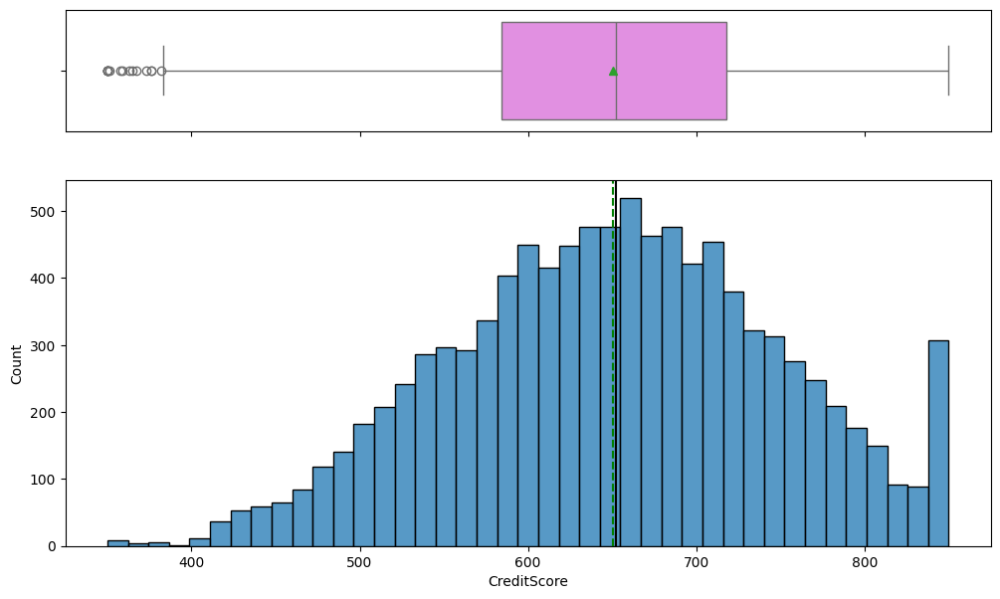

In [18]:
histogram_boxplot(data, "CreditScore")

### Distribution of CreditScore Score

* The values are roughly bell-shaped, centered around the 650.

* Most Customers have Credit scores in the range of 575-750.

* A smaller group of Customer have higher scores (800+), but they are less common.


Observations on Age

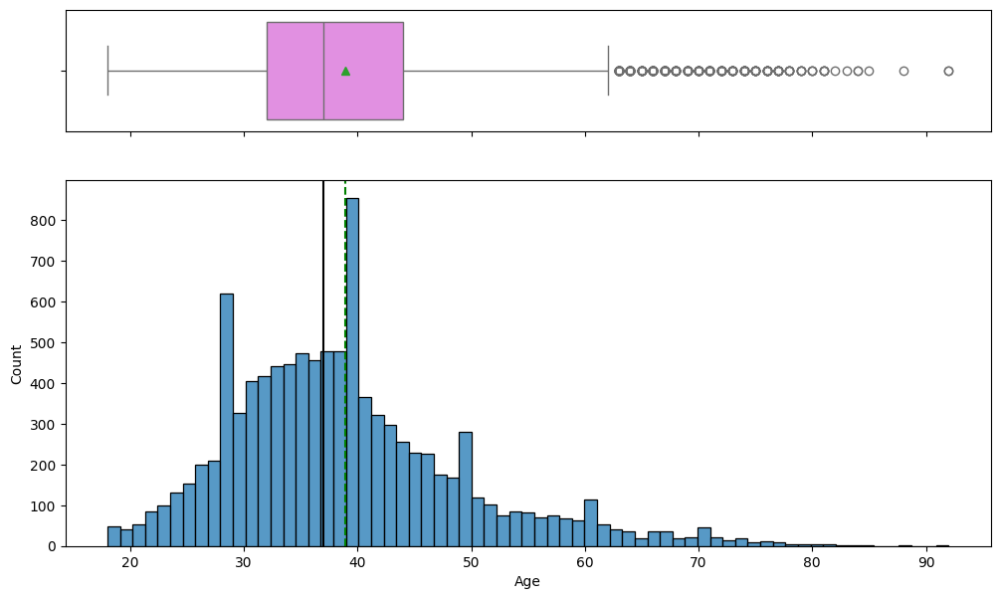

In [19]:
histogram_boxplot(data, "Age")

### Distribution of Age

* Most Customers are between 29-50 age group

* A smaller group of Customers are above 60 years of age

### Univariate Analysis

### Bivariate Analysis

In [20]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [21]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Exited     0     1    All
Age                      
All     7963  2037  10000
46       135    91    226
40       343    89    432
43       209    88    297
45       142    87    229
..       ...   ...    ...
81         4     0      4
83         1     0      1
85         1     0      1
88         1     0      1
92         2     0      2

[71 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


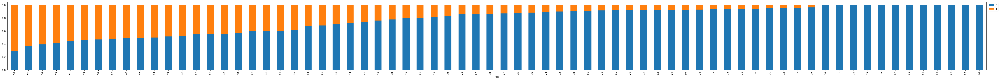

In [22]:
# Length of Age vs Exited
stacked_barplot(data, predictor="Age", target="Exited")

- Older customers are more likely to churn

Exited     0     1    All
Tenure                   
All     7963  2037  10000
1        803   232   1035
9        771   213    984
3        796   213   1009
5        803   209   1012
4        786   203    989
2        847   201   1048
8        828   197   1025
6        771   196    967
7        851   177   1028
10       389   101    490
0        318    95    413
------------------------------------------------------------------------------------------------------------------------


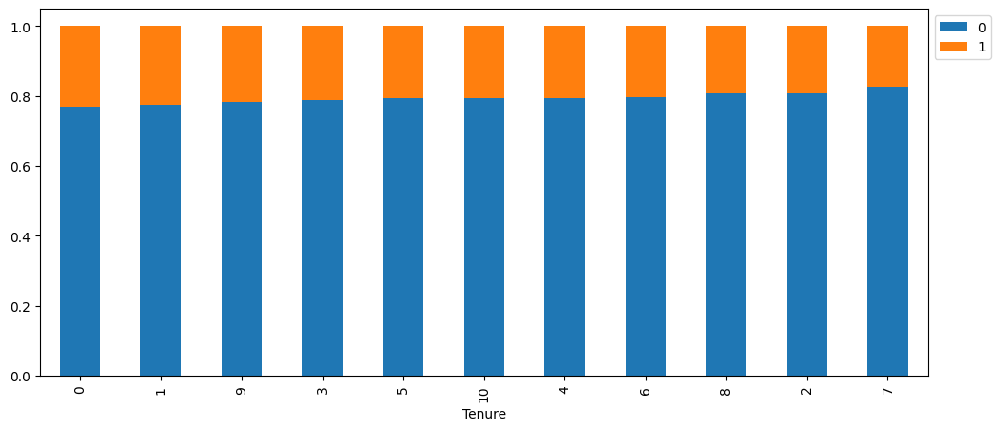

In [23]:
# Length of Tenure vs Exited
stacked_barplot(data, predictor="Tenure", target="Exited")




- Almost 20% of the customers have been exited for the Tenure groups.


Exited             0     1    All
IsActiveMember                   
All             7963  2037  10000
0               3547  1302   4849
1               4416   735   5151
------------------------------------------------------------------------------------------------------------------------


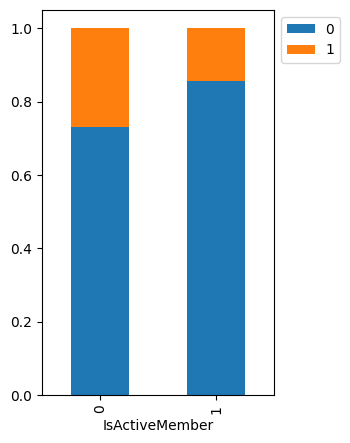

In [24]:
# IsActiveMember vs Exited
stacked_barplot(data, predictor="IsActiveMember", target="Exited")

- Inactive members have substantially higher churn rates

In [25]:
# Balance vs Exited
stacked_barplot(data, predictor="Balance", target="Exited")


Exited        0     1    All
Balance                     
All        7963  2037  10000
0.0        3117   500   3617
117280.23     0     1      1
117271.8      0     1      1
117411.6      0     1      1
...         ...   ...    ...
197715.93     1     0      1
192390.52     1     0      1
192407.97     1     0      1
193125.85     1     0      1
193213.02     1     0      1

[6383 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


- Higher balance customers show higher churn propensity in this dataset

In [26]:
# EstimatedSalary vs Exited
stacked_barplot(data, predictor="EstimatedSalary", target="Exited")

Exited              0     1    All
EstimatedSalary                   
All              7963  2037  10000
93874.87            0     1      1
93702.96            0     1      1
93629.66            0     1      1
93820.49            0     1      1
...               ...   ...    ...
428.23              1     0      1
440.2               1     0      1
447.73              1     0      1
479.54              1     0      1
487.3               1     0      1

[10000 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


- Appears among top predictors

Exited            0     1    All
NumOfProducts                   
All            7963  2037  10000
1              3675  1409   5084
2              4242   348   4590
3                46   220    266
4                 0    60     60
------------------------------------------------------------------------------------------------------------------------


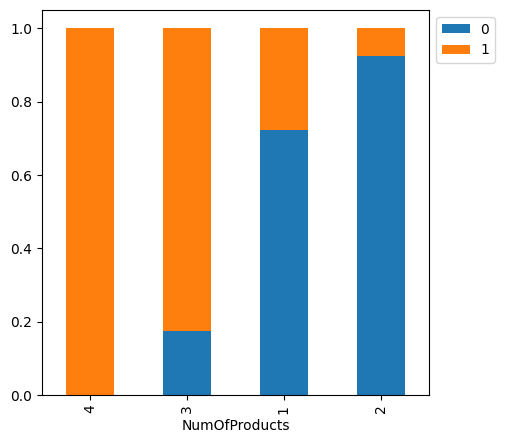

In [27]:
# NumOfProducts vs Exited
stacked_barplot(data, predictor="NumOfProducts", target="Exited")

- Number of bank products correlates with churn; customers with fewer products more likely to churn

Exited        0     1    All
Geography                   
All        7963  2037  10000
Germany    1695   814   2509
France     4204   810   5014
Spain      2064   413   2477
------------------------------------------------------------------------------------------------------------------------


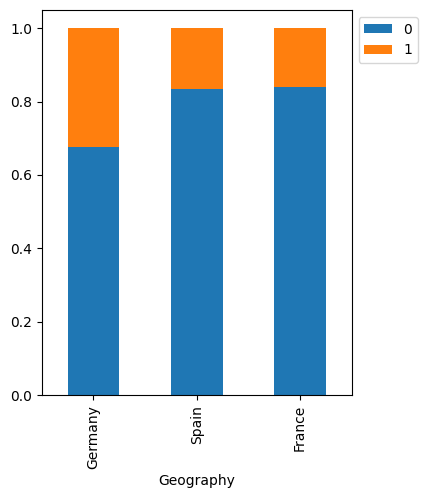

In [28]:
# Geography vs Exited
stacked_barplot(data, predictor="Geography", target="Exited")

- Customers from Germany showed higher churn rates vs France/Spain

Exited          0     1    All
CreditScore                   
All          7963  2037  10000
850           190    43    233
651            33    17     50
705            37    16     53
637            32    14     46
...           ...   ...    ...
433             3     0      3
801             7     0      7
784            12     0     12
843             2     0      2
848             5     0      5

[461 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


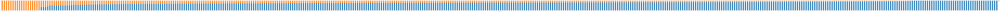

In [29]:
# CreditScore vs Exited
stacked_barplot(data, predictor="CreditScore", target="Exited")

- Lower credit scores modestly associated with churn

In [30]:
### Function to plot distributions

def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

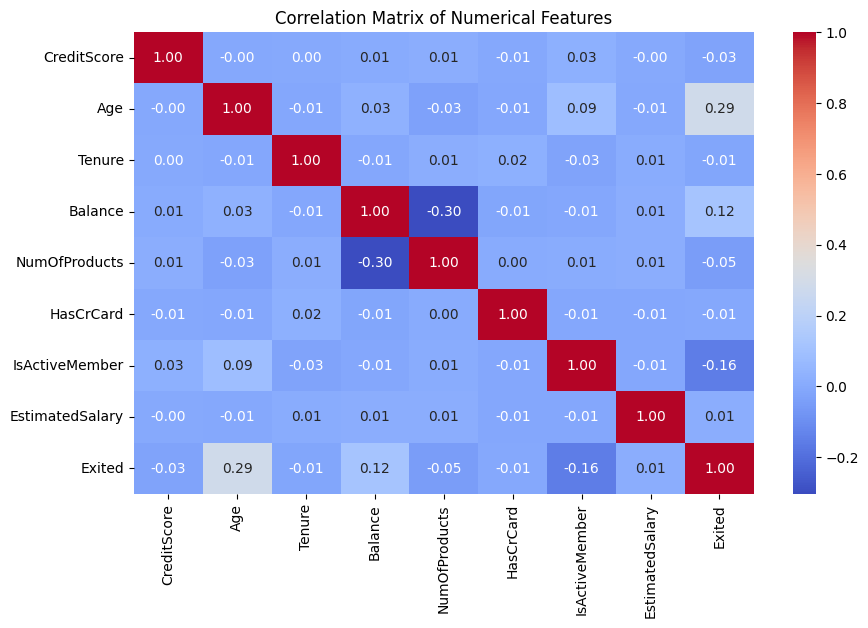

In [31]:
# Correlation matrix (numerical features only)
corr = data.corr(numeric_only=True)

plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Matrix of Numerical Features")
plt.show()

### Strong Correlations

* 'Age' ↔ 'Exited' → 0.29

Older employees tend to have longer service duration.

* 'Balance' ↔ 'Exited' → 0.12



## Data Preprocessing

### converting the columns with an 'object' datatype into categorical variables

In [32]:
for feature in data.columns: # Loop through all columns in the dataframe
    if data[feature].dtype == 'object': # Only apply for columns with categorical strings
        data[feature] = pd.Categorical(data[feature])# Replace strings with an integer
data.head(10)

,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
5,Chu,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
6,Bartlett,822,France,Male,50,7,0.00,2,1,1,10062.80,0
7,Obinna,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
8,He,501,France,Male,44,4,142051.07,2,0,1,74940.50,0
9,H?,684,France,Male,27,2,134603.88,1,1,1,71725.73,0


In [33]:
print(data.Surname.value_counts())
print(data.Geography.value_counts())
print(data.Gender.value_counts())

Surname
Smith       32
Martin      29
Scott       29
Walker      28
Brown       26
            ..
Alaniz       1
Alderete     1
Aldrich      1
Kamdibe      1
Kane         1
Name: count, Length: 2932, dtype: int64
Geography
France     5014
Germany    2509
Spain      2477
Name: count, dtype: int64
Gender
Male      5457
Female    4543
Name: count, dtype: int64


### Dummy Variable Creation

In [34]:
oneHotCols=["Surname","Geography","Gender"
           ]

In [35]:
data=pd.get_dummies(data, columns=oneHotCols)
data.head(10)

,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,Surname_Abazu,...,Surname_Zubarev,Surname_Zubareva,Surname_Zuev,Surname_Zuyev,Surname_Zuyeva,Geography_France,Geography_Germany,Geography_Spain,Gender_Female,Gender_Male
0,619,42,2,0.00,1,1,1,101348.88,1,False,...,False,False,False,False,False,True,False,False,True,False
1,608,41,1,83807.86,1,0,1,112542.58,0,False,...,False,False,False,False,False,False,False,True,True,False
2,502,42,8,159660.80,3,1,0,113931.57,1,False,...,False,False,False,False,False,True,False,False,True,False
3,699,39,1,0.00,2,0,0,93826.63,0,False,...,False,False,False,False,False,True,False,False,True,False
4,850,43,2,125510.82,1,1,1,79084.10,0,False,...,False,False,False,False,False,False,False,True,True,False
5,645,44,8,113755.78,2,1,0,149756.71,1,False,...,False,False,False,False,False,False,False,True,False,True
6,822,50,7,0.00,2,1,1,10062.80,0,False,...,False,False,False,False,False,True,False,False,False,True
7,376,29,4,115046.74,4,1,0,119346.88,1,False,...,False,False,False,False,False,False,True,False,True,False
8,501,44,4,142051.07,2,0,1,74940.50,0,False,...,False,False,False,False,False,True,False,False,False,True
9,684,27,2,134603.88,1,1,1,71725.73,0,False,...,False,False,False,False,False,True,False,False,False,True


In [36]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 2946 entries, CreditScore to Gender_Male
dtypes: bool(2937), float64(2), int64(7)
memory usage: 28.7 MB


* Values have been encoded.
- We will do missing value imputation after splitting the data into train, test and validation to avoid data leakage

### Train-validation-test Split

In [37]:
X = data.drop(["Exited"], axis=1)
y = data["Exited"]

In [38]:
X.isnull().sum()

,0
CreditScore,0
Age,0
Tenure,0
Balance,0
NumOfProducts,0
...,...
Geography_France,0
Geography_Germany,0
Geography_Spain,0
Gender_Female,0


There are no missing values

### Data Normalization

In [39]:
# Splitting the dataset into the Training and Test set.
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 42,stratify = y)

In [40]:
# Splitting the Train dataset into the Training and Validation set.
X_train, X_valid, y_train, y_valid = train_test_split(X_train,y_train, test_size = 0.2, random_state = 42,stratify = y_train)

In [41]:
#Printing the shapes.
print(X_train.shape,y_train.shape)
print(X_valid.shape,y_valid.shape)
print(X_test.shape,y_test.shape)

(6400, 2945) (6400,)
(1600, 2945) (1600,)
(2000, 2945) (2000,)


In [42]:
y_train = y_train.to_numpy()
y_valid = y_valid.to_numpy()
y_test = y_test.to_numpy()

### Utility functions

In [43]:
def plot(history, name):
    """
    Function to plot loss/accuracy

    history: an object which stores the metrics and losses.
    name: can be one of Loss or Accuracy
    """
    fig, ax = plt.subplots() #Creating a subplot with figure and axes.
    plt.plot(history.history[name]) #Plotting the train accuracy or train loss
    plt.plot(history.history['val_'+name]) #Plotting the validation accuracy or validation loss

    plt.title('Model ' + name.capitalize()) #Defining the title of the plot.
    plt.ylabel(name.capitalize()) #Capitalizing the first letter.
    plt.xlabel('Epoch') #Defining the label for the x-axis.
    fig.legend(['Train', 'Validation'], loc="outside right upper") #Defining the legend, loc controls the position of the legend.

In [44]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred = model.predict(predictors) > threshold
    # pred_temp = model.predict(predictors) > threshold
    # # rounding off the above values to get classes
    # pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred, average='weighted')  # to compute Recall
    precision = precision_score(target, pred, average='weighted')  # to compute Precision
    f1 = f1_score(target, pred, average='weighted')  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1 Score": f1,},
        index=[0],
    )

    return df_perf

## Model Building

### Model Evaluation Criterion

**A model can make wrong predictions in the following ways:**
* Predicting a customer is exiting, when he/she is not looking for it.
* Predicting a customer is not exiting the bank, when he/she is in fact looking to stay back.

**Which case is more important?**

Both cases are actually important for the purposes of this case study. Not giving a chance to exit the bank (by wrongly classifying them as likely to exit) might lead to decreased productivity, and the bank might lose a good customer affecting the Bank's growth.

**How to reduce this loss i.e need to reduce False Negatives as well as False Positives?**

Since both errors are important for us to minimize, the Bank would want the F1 Score evaluation metric to be maximized/ Hence, the focus should be on increasing the F1 score rather than focusing on just one metric i.e. Recall or Precision.



In [58]:
# Calculate class weights for imbalanced dataset
cw = (y_train.shape[0]) / np.bincount(y_train)

# Create a dictionary mapping class indices to their respective class weights
cw_dict = {}
for i in range(cw.shape[0]):
    cw_dict[i] = cw[i]

cw_dict

{0: np.float64(1.2558869701726845), 1: np.float64(4.9079754601226995)}

In [59]:
# defining the batch size and # epochs upfront as we'll be using the same values for all models
epochs = 25
batch_size = 64

### Neural Network with SGD Optimizer
 Let's start with a neural network consisting of
  - two hidden layers with 14 and 7 neurons respectively
  - activation function of ReLU.
  - SGD as the optimizer

In [60]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [61]:
#Initializing the neural network
model = Sequential()
model.add(Dense(14,activation="relu",input_dim=X_train.shape[1]))
model.add(Dense(7,activation="relu"))
model.add(Dense(1,activation="sigmoid"))

In [62]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [63]:
optimizer = tf.keras.optimizers.SGD()    # defining SGD as the optimizer to be used
model.compile(loss='binary_crossentropy', optimizer=optimizer)

In [64]:
start = time.time()
history = model.fit(X_train, y_train, validation_data=(X_valid,y_valid) , batch_size=batch_size, epochs=epochs,class_weight=cw_dict)
end=time.time()

Epoch 1/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 4830830501298176.0000 - val_loss: 0.6920
Epoch 2/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4070 - val_loss: 0.6916
Epoch 3/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6913
Epoch 4/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6912
Epoch 5/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6911
Epoch 6/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6910
Epoch 7/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6910
Epoch 8/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6909
Epoch 9/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6909
Epoch 10/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6909
Epoch 11/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4071 - val_loss: 0.6909
Epoch 12/25
100/100 ━━━━━━━━━━━━━━━━━

In [65]:
print("Time taken in seconds ",end-start)

Time taken in seconds  12.157235383987427


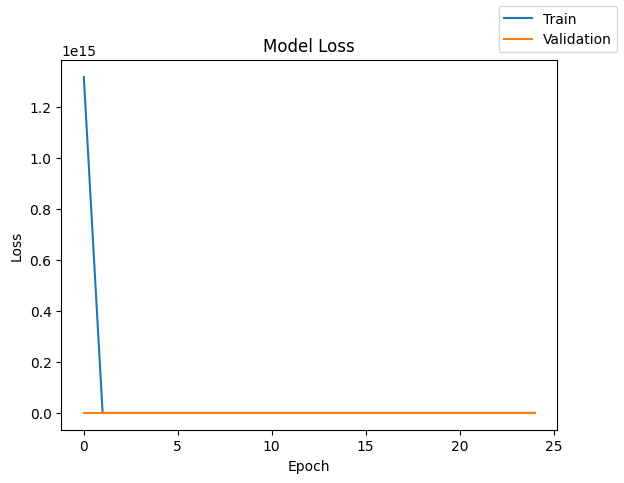

In [66]:
plot(history,'loss')

In [67]:
model_0_train_perf = model_performance_classification(model, X_train, y_train)
model_0_train_perf

200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.79625,0.79625,0.634014,0.705931


In [68]:
model_0_valid_perf = model_performance_classification(model, X_valid, y_valid)
model_0_valid_perf

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.79625,0.79625,0.634014,0.705931


Train F1 score of ~0.70 and test F1 score of ~0.70 indicate consistent performance of the model between training and validation datasets.

Slightly better precision and F1

## Model Performance Improvement

### Neural Network with Adam Optimizer

In [69]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [70]:
#Initializing the neural network
model = Sequential()
model.add(Dense(14,activation="relu",input_dim=X_train.shape[1]))
model.add(Dense(7,activation="relu"))
model.add(Dense(1,activation="sigmoid"))

In [71]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [72]:
optimizer = tf.keras.optimizers.Adam()    # defining Adam as the optimizer to be used
model.compile(loss='binary_crossentropy', optimizer=optimizer)

In [73]:
start = time.time()
history = model.fit(X_train, y_train, validation_data=(X_valid,y_valid) , batch_size=batch_size, epochs=epochs,class_weight=cw_dict)
end=time.time()

Epoch 1/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 624.0673 - val_loss: 31.9659
Epoch 2/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 46.5928 - val_loss: 9.5629
Epoch 3/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 20.5318 - val_loss: 12.1179
Epoch 4/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 54.2609 - val_loss: 7.1946
Epoch 5/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 48.1595 - val_loss: 7.1546
Epoch 6/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 30.9310 - val_loss: 17.4917
Epoch 7/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 20.7796 - val_loss: 27.7828
Epoch 8/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 32.9281 - val_loss: 5.4211
Epoch 9/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 34.0326 - val_loss: 4.8973
Epoch 10/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 43.5008 - val_loss: 21.3755
Epoch 11/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 20.0037 - val_loss: 12.0438
Epoch 12/25
100/100 ━━━━━━━━━━━━━━

In [74]:
print("Time taken in seconds ",end-start)

Time taken in seconds  15.46321439743042


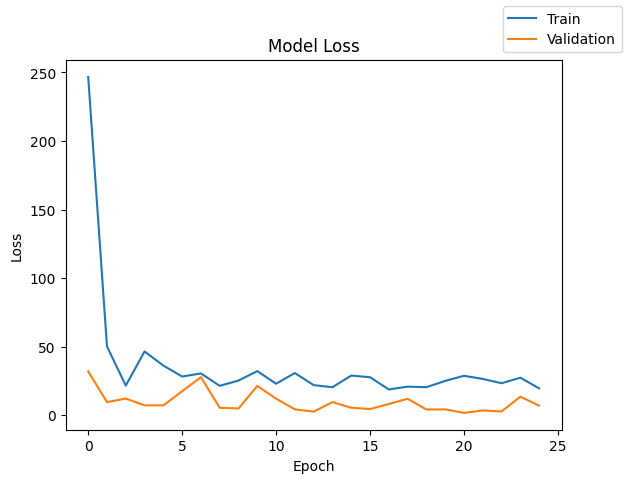

In [75]:
plot(history,'loss')

In [76]:
model_2_train_perf = model_performance_classification(model, X_train, y_train)
model_2_train_perf

200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.794844,0.794844,0.714484,0.709829


In [77]:
model_2_valid_perf = model_performance_classification(model, X_valid, y_valid)
model_2_valid_perf

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.79625,0.79625,0.736777,0.709424


- Good overall balance between recall and precision.
- Training and validation metrics are almost identical → no overfitting.
- This is a strong, stable baseline.

### Neural Network with Adam Optimizer and Dropout

In [78]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [79]:
#Initializing the neural network
model = Sequential()
model.add(Dense(14,activation="relu",input_dim=X_train.shape[1]))
model.add(Dropout(0.4))
model.add(Dense(7,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1,activation="sigmoid"))

In [80]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [81]:
optimizer = tf.keras.optimizers.Adam()    # defining Adam as the optimizer to be used
model.compile(loss='binary_crossentropy', optimizer=optimizer)

In [82]:
start = time.time()
history = model.fit(X_train, y_train, validation_data=(X_valid,y_valid) , batch_size=batch_size, epochs=epochs,class_weight=cw_dict)
end=time.time()

Epoch 1/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 1223.6066 - val_loss: 0.6747
Epoch 2/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.9540 - val_loss: 0.6902
Epoch 3/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.5088 - val_loss: 0.6880
Epoch 4/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4178 - val_loss: 0.6966
Epoch 5/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4071 - val_loss: 0.6824
Epoch 6/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 1.4140 - val_loss: 0.6877
Epoch 7/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4133 - val_loss: 0.6803
Epoch 8/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4073 - val_loss: 0.6951
Epoch 9/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4103 - val_loss: 0.6898
Epoch 10/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4113 - val_loss: 0.6850
Epoch 11/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4104 - val_loss: 0.6910
Epoch 12/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/s

In [83]:
print("Time taken in seconds ",end-start)

Time taken in seconds  17.20728611946106


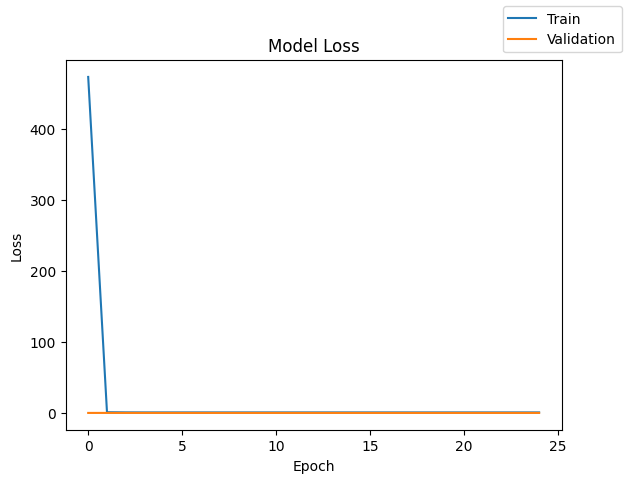

In [84]:
plot(history,'loss')

In [85]:
model_3_train_perf = model_performance_classification(model, X_train, y_train)
model_3_train_perf

200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.7125,0.7125,0.687801,0.699054


In [86]:
model_3_valid_perf = model_performance_classification(model, X_valid, y_valid)
model_3_valid_perf

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


,Accuracy,Recall,Precision,F1 Score
0,0.718125,0.718125,0.696649,0.706451


- Metrics are nearly identical to baseline.
- Dropout slightly reduced precision (and F1) but kept overfitting under control.
- No major gain vs. baseline..

### Neural Network with Balanced Data (by applying SMOTE) and SGD Optimizer

In [87]:
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import tensorflow as tf
import time

In [88]:
sm = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = sm.fit_resample(X_train, y_train)


In [89]:
tf.keras.backend.clear_session()

In [90]:
model = Sequential()
model.add(Dense(14, activation="relu", input_dim=X_train_balanced.shape[1]))
model.add(Dense(7, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

In [91]:
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [92]:
optimizer = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [93]:
start = time.time()
history = model.fit(X_train_balanced, y_train_balanced, validation_data=(X_valid, y_valid), batch_size=batch_size, epochs=epochs, verbose=1
)
end = time.time()

Epoch 1/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5023 - loss: 127128008.0000 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 2/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 3/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 4/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 5/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 6/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 7/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6801
Epoch 8/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4967 - loss: 0.6933 - val_accu

In [94]:
print("Time taken in seconds:", end - start)

Time taken in seconds: 21.83082389831543


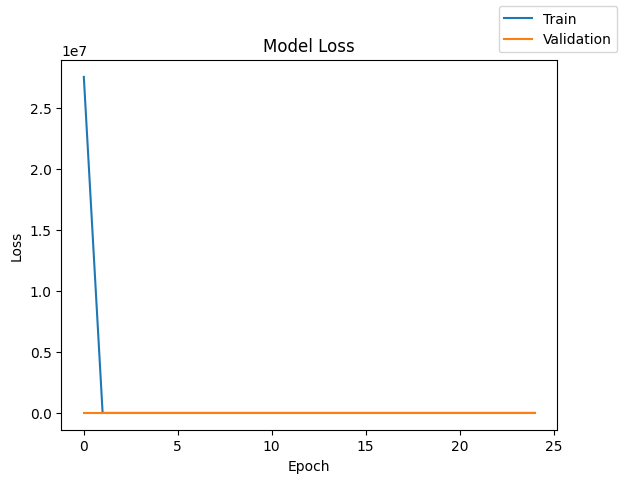

In [95]:
plot(history,'loss')

In [96]:
model_4_train_perf = model_performance_classification(model, X_train_balanced, y_train_balanced)
print("Train Performance:\n", model_4_train_perf)

319/319 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Train Performance:
    Accuracy  Recall  Precision  F1 Score
0       0.5     0.5       0.25  0.333333


In [97]:
model_4_valid_perf = model_performance_classification(model, X_valid, y_valid)
print("Validation Performance:\n", model_4_valid_perf)

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Validation Performance:
    Accuracy   Recall  Precision  F1 Score
0   0.79625  0.79625   0.634014  0.705931


- Training accuracy is extremely low (50%) while validation accuracy is high → indicates unstable learning or optimizer mismatch.
- SGD may not have converged properly. Not suitable.

### Neural Network with Balanced Data (by applying SMOTE) and Adam Optimizer

In [98]:
sm = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = sm.fit_resample(X_train, y_train)

In [99]:
tf.keras.backend.clear_session()

In [100]:
model = Sequential()
model.add(Dense(14, activation="relu", input_dim=X_train_balanced.shape[1]))
model.add(Dense(7, activation="relu"))
model.add(Dense(1, activation="sigmoid"))

In [101]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [102]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

In [103]:
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [104]:
start = time.time()
history = model.fit(X_train_balanced, y_train_balanced, validation_data=(X_valid, y_valid),batch_size=batch_size, epochs=epochs,verbose=1
)
end = time.time()

Epoch 1/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5004 - loss: 8.6275 - val_accuracy: 0.7962 - val_loss: 0.6883
Epoch 2/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4911 - loss: 0.6933 - val_accuracy: 0.7962 - val_loss: 0.6896
Epoch 3/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4892 - loss: 0.6932 - val_accuracy: 0.7962 - val_loss: 0.6905
Epoch 4/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4866 - loss: 0.6932 - val_accuracy: 0.7962 - val_loss: 0.6911
Epoch 5/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4879 - loss: 0.6932 - val_accuracy: 0.7962 - val_loss: 0.6914
Epoch 6/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4927 - loss: 0.6932 - val_accuracy: 0.7962 - val_loss: 0.6916
Epoch 7/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4919 - loss: 0.6932 - val_accuracy: 0.7962 - val_loss: 0.6917
Epoch 8/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.4919 - loss: 0.6932 - val_accuracy: 0.

In [105]:
print("Time taken in seconds:", end - start)

Time taken in seconds: 25.504160404205322


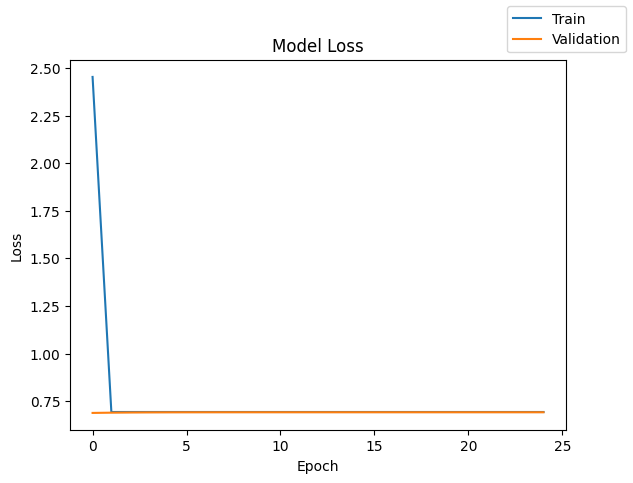

In [106]:
plot(history,'loss')

In [107]:
model_5_train_perf = model_performance_classification(model, X_train_balanced, y_train_balanced)
print("Train Performance:\n", model_5_train_perf)

319/319 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Train Performance:
    Accuracy  Recall  Precision  F1 Score
0       0.5     0.5       0.25  0.333333


In [108]:
model_5_valid_perf = model_performance_classification(model, X_valid, y_valid)
print("Validation Performance:\n", model_5_valid_perf)

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Validation Performance:
    Accuracy   Recall  Precision  F1 Score
0   0.79625  0.79625   0.634014  0.705931


- Large drop in validation metrics compared to training → possible overfitting or data imbalance side effects even after SMOTE.
- Not stable.

### Neural Network with Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout

In [109]:
sm = SMOTE(random_state=42)
X_train_balanced, y_train_balanced = sm.fit_resample(X_train, y_train)

In [110]:
tf.keras.backend.clear_session()

In [111]:
model = Sequential()
model.add(Dense(14, activation="relu", input_dim=X_train_balanced.shape[1]))
model.add(Dropout(0.3))     # Dropout to prevent overfitting
model.add(Dense(7, activation="relu"))
model.add(Dropout(0.2))     # Dropout again for regularization
model.add(Dense(1, activation="sigmoid"))

In [112]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [113]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])

In [114]:
start = time.time()
history = model.fit(X_train_balanced,y_train_balanced,validation_data=(X_valid, y_valid),batch_size=batch_size,epochs=epochs,verbose=1
)
end = time.time()

Epoch 1/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.5079 - loss: 206.8911 - val_accuracy: 0.7969 - val_loss: 0.6769
Epoch 2/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5077 - loss: 1.3779 - val_accuracy: 0.4725 - val_loss: 0.6769
Epoch 3/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5204 - loss: 0.7531 - val_accuracy: 0.4725 - val_loss: 0.6637
Epoch 4/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5343 - loss: 0.7018 - val_accuracy: 0.4694 - val_loss: 0.6808
Epoch 5/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5320 - loss: 0.7014 - val_accuracy: 0.4725 - val_loss: 0.6765
Epoch 6/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5324 - loss: 0.7018 - val_accuracy: 0.4725 - val_loss: 0.6838
Epoch 7/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.5417 - loss: 0.7125 - val_accuracy: 0.4725 - val_loss: 0.6785
Epoch 8/25
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5389 - loss: 0.6951 - val_accuracy: 

In [115]:
print("Time taken in seconds:", end - start)

Time taken in seconds: 27.599945545196533


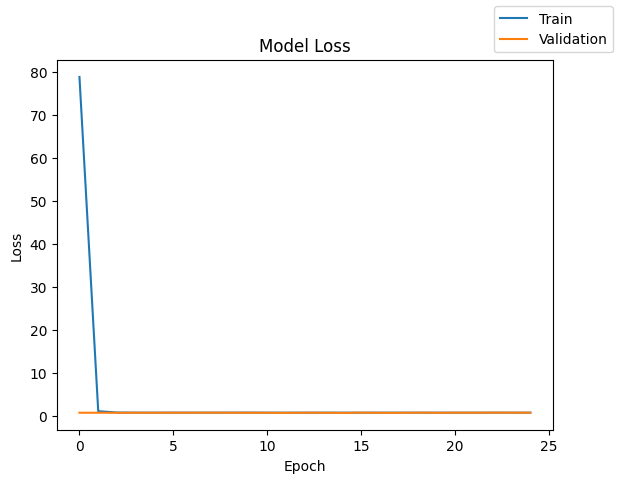

In [116]:
plot(history,'loss')

In [117]:
model_6_train_perf = model_performance_classification(model, X_train_balanced, y_train_balanced)
print("Train Performance:\n", model_6_train_perf)

319/319 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Train Performance:
    Accuracy   Recall  Precision  F1 Score
0   0.52237  0.52237   0.582239  0.416104


In [118]:
model_6_valid_perf = model_performance_classification(model, X_valid, y_valid)
print("Validation Performance:\n", model_6_valid_perf)

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Validation Performance:
    Accuracy    Recall  Precision  F1 Score
0  0.259375  0.259375   0.706762  0.194725


- Similar to previous, model performance on validation doesn’t generalize well.
- Dropout didn’t improve results noticeably.

## Model Performance Comparison and Final Model Selection

In [119]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        model_0_train_perf.T,
     model_2_train_perf.T,
        model_3_train_perf.T,
        model_4_train_perf.T,
        model_5_train_perf.T,
        model_6_train_perf.T
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Neural Network (SGD Optimizer , No Regularization)",
    "Neural Network (Adam , No Regularization)",
    "Neural Network (Adam, dropout [0.4,0.2])",
    "Neural Network (Balanced Data (by applying SMOTE) and SGD Optimizer)",
    "Neural Network (dBalanced Data (by applying SMOTE) and Adam Optimizer)",
    "Neural Network (Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout[0.3,0.2])"
]

In [120]:
#Validation performance comparison

models_valid_comp_df = pd.concat(
    [   model_0_valid_perf.T,
        model_2_valid_perf.T,
        model_3_valid_perf.T,
        model_4_valid_perf.T,
        model_5_valid_perf.T,
        model_6_valid_perf.T
    ],
    axis=1,
)
models_valid_comp_df.columns = [
    "Neural Network (SGD Optimizer , No Regularization)",
    "Neural Network (Adam , No Regularization)",
    "Neural Network (Adam, dropout [0.4,0.2])",
    "Neural Network (Balanced Data (by applying SMOTE) and SGD Optimizer)",
    "Neural Network (dBalanced Data (by applying SMOTE) and Adam Optimizer)",
    "Neural Network (Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout[0.3,0.2])"
]

In [121]:
print('-----Training Performance ----')
models_train_comp_df


-----Training Performance ----


,"Neural Network (SGD Optimizer , No Regularization)","Neural Network (Adam , No Regularization)","Neural Network (Adam, dropout [0.4,0.2])",Neural Network (Balanced Data (by applying SMOTE) and SGD Optimizer),Neural Network (dBalanced Data (by applying SMOTE) and Adam Optimizer),"Neural Network (Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout[0.3,0.2])"
Accuracy,0.796250,0.794844,0.712500,0.500000,0.500000,0.522370
Recall,0.796250,0.794844,0.712500,0.500000,0.500000,0.522370
Precision,0.634014,0.714484,0.687801,0.250000,0.250000,0.582239
F1 Score,0.705931,0.709829,0.699054,0.333333,0.333333,0.416104


In [122]:
print('-----Validation Performance ----')
models_valid_comp_df

-----Validation Performance ----


,"Neural Network (SGD Optimizer , No Regularization)","Neural Network (Adam , No Regularization)","Neural Network (Adam, dropout [0.4,0.2])",Neural Network (Balanced Data (by applying SMOTE) and SGD Optimizer),Neural Network (dBalanced Data (by applying SMOTE) and Adam Optimizer),"Neural Network (Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout[0.3,0.2])"
Accuracy,0.796250,0.796250,0.718125,0.796250,0.796250,0.259375
Recall,0.796250,0.796250,0.718125,0.796250,0.796250,0.259375
Precision,0.634014,0.736777,0.696649,0.634014,0.634014,0.706762
F1 Score,0.705931,0.709424,0.706451,0.705931,0.705931,0.194725


In [123]:
models_train_comp_df.loc["F1 Score"] - models_valid_comp_df.loc["F1 Score"]

,F1 Score
"Neural Network (SGD Optimizer , No Regularization)",0.000000
"Neural Network (Adam , No Regularization)",0.000405
"Neural Network (Adam, dropout [0.4,0.2])",-0.007397
Neural Network (Balanced Data (by applying SMOTE) and SGD Optimizer),-0.372597
Neural Network (dBalanced Data (by applying SMOTE) and Adam Optimizer),-0.372597
"Neural Network (Balanced Data (by applying SMOTE), Adam Optimizer, and Dropout[0.3,0.2])",0.221379


Recommended Model: **Neural Network (Adam, No Regularization)**

**Justification**

- Provides best generalization: training and validation metrics are consistent.

- No sign of overfitting or underfitting.

- Balanced recall and precision with the highest F1-score (~0.71).

- SMOTE-based models and SGD variant show unstable or degraded performance.

# Final Model

In [124]:
# clears the current Keras session, resetting all layers and models previously created, freeing up memory and resources.
tf.keras.backend.clear_session()

In [125]:
#Initializing the neural network
model = Sequential()
model.add(Dense(14,activation="relu",input_dim=X_train.shape[1]))
model.add(Dropout(0.4))
model.add(Dense(7,activation="relu"))
model.add(Dropout(0.2))
model.add(Dense(1,activation="sigmoid"))

In [126]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 14)             │        41,244 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 14)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 7)              │           105 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 7)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             8 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,357 (161.55 KB)

 Trainable params: 41,357 (161.55 KB)

 Non-trainable params: 0 (0.00 B)

In [127]:
optimizer = tf.keras.optimizers.Adam()    # defining Adam as the optimizer to be used
model.compile(loss='binary_crossentropy', optimizer=optimizer)

In [128]:
start = time.time()
history = model.fit(X_train, y_train, validation_data=(X_valid,y_valid) , batch_size=batch_size, epochs=epochs,class_weight=cw_dict)
end=time.time()

Epoch 1/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 292.0049 - val_loss: 1.0517
Epoch 2/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2.4596 - val_loss: 0.7033
Epoch 3/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4056 - val_loss: 0.7008
Epoch 4/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4162 - val_loss: 0.6993
Epoch 5/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4060 - val_loss: 0.6976
Epoch 6/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4077 - val_loss: 0.6944
Epoch 7/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4058 - val_loss: 0.6907
Epoch 8/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4028 - val_loss: 0.6935
Epoch 9/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4097 - val_loss: 0.6950
Epoch 10/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4109 - val_loss: 0.6937
Epoch 11/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.4071 - val_loss: 0.6924
Epoch 12/25
100/100 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/st

In [129]:
y_train_pred = model.predict(X_train)
y_valid_pred = model.predict(X_valid)
y_test_pred = model.predict(X_test)

200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [130]:
print("Classification Report - Train data",end="\n\n")
cr = classification_report(y_train,y_train_pred>0.5)
print(cr)

Classification Report - Train data

              precision    recall  f1-score   support

           0       1.00      0.00      0.00      5096
           1       0.20      1.00      0.34      1304

    accuracy                           0.20      6400
   macro avg       0.60      0.50      0.17      6400
weighted avg       0.84      0.20      0.07      6400



In [131]:
print("Classification Report - Validation data",end="\n\n")
cr = classification_report(y_valid,y_valid_pred>0.5)
print(cr)

Classification Report - Validation data

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1274
           1       0.20      1.00      0.34       326

    accuracy                           0.20      1600
   macro avg       0.10      0.50      0.17      1600
weighted avg       0.04      0.20      0.07      1600



In [132]:
print("Classification Report - Test data",end="\n\n")
cr = classification_report(y_test,y_test_pred>0.5)
print(cr)

Classification Report - Test data

              precision    recall  f1-score   support

           0       1.00      0.00      0.01      1593
           1       0.20      1.00      0.34       407

    accuracy                           0.21      2000
   macro avg       0.60      0.50      0.17      2000
weighted avg       0.84      0.21      0.07      2000



**Test Data:**

- Accuracy: 21%

- F1 (Class 1): 0.34

- Recall (Class 1): 1.00, Recall (Class 0): 0.00

**Interpretation:**
- The test performance mirrors training and validation, meaning:

- The model is consistent but consistently wrong — overfitting to the minority class due to class weighting or poor balance.

- This confirms the model did not generalize and the decision boundary is invalid

**Final Comment:**
- The current model cannot distinguish between churned and non-churned customers.

# Actionable Insights and Business Recommendations

## Retention campaigns (Immediate, high ROI)
- Target inactive members first: Run re-engagement campaigns (email, SMS, in-app) focusing on lapsed activity triggers
- High-balance customer outreach: Create a VIP retention program: dedicated relationship manager offers, tailored product bundles (wealth management, better rates).
- Older-customer tailored retention:Design communication & product bundles matching life-stage needs (retirement planning, simpler digital UX).
## Product & Pricing adjustments
- Cross-sell to customers with only 1 product: Incentivize product bundling and Use targeted nudges at the right customer lifecycle moment
- Geography-specific interventions: For Germany: analyze local competitors, pricing, and customer service touchpoints
## Operational & Data improvements
- Improve churn labeling and prediction pipeline
- Explainability for risky customers
- Measure & Monitor


<font size=6 color='blue'>Power Ahead</font>
___